In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import pickle as pkl
from copy import copy

In [2]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)

In [3]:
prefix = '/data/xyzeq/xyzeq/'

In [4]:
adata = sc.read_h5ad(prefix + 'concatenated.deep/deep/concat.deep.adata.m.and.h.combatted.h5ad')

In [4]:
def hv_run(adata,flavor='cell_ranger'):    # Extract out highly variable genes, but don't subset just yet.
    hv_adata = adata.copy()
    sc.pp.highly_variable_genes(hv_adata, flavor=flavor,inplace=True, 
                                n_bins=500)
    return hv_adata

def hv_plot(hv_adata, gate=None, highlight_genes=None):
    plt.figure(figsize=(7,7))
    plt.minorticks_on()
    plt.xscale('log')
#     plt.yscale('log')
    plt.grid(True,which='both',axis='both')
    plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
    if type(highlight_genes) != type(None):
        mask = [i in highlight_genes for i in hv_adata.var_names]
        highlight_means = hv_adata.var['means'].values[mask]
        highlight_disps = hv_adata.var['dispersions_norm'].values[mask]
        plt.plot(highlight_means,highlight_disps,linewidth=0, marker='o',markersize=10, color='r', mfc='none', mew=0.5);
#     plt.xlim(-0.05, 0.05)
    ax = plt.gca()
    if type(gate) != type(None):
        gatepatch = patches.Polygon(gate,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
        ax.add_patch(gatepatch);

def hv_genes(hv_adata, gate, adata=None):
    '''
    Receive boolean for genes in gate or new subsetted adata object, if provided.
    '''
    genes = list()
    means = hv_adata.var['means'].values
    disps = hv_adata.var['dispersions_norm'].values
    pointsmap = map(Point,means,disps)
    polygon = Polygon(gate)
    for i in pointsmap:
        genes.append(polygon.contains(i))
    if type(adata) != type(None):
        adata = adata[:,genes].copy()
        return adata
    else:
        return genes

In [5]:
sc.pp.scale(adata, max_value=10)

    ... clipping at max_value 10


## Dimensionality Reduction and Visualization

In [6]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:36)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


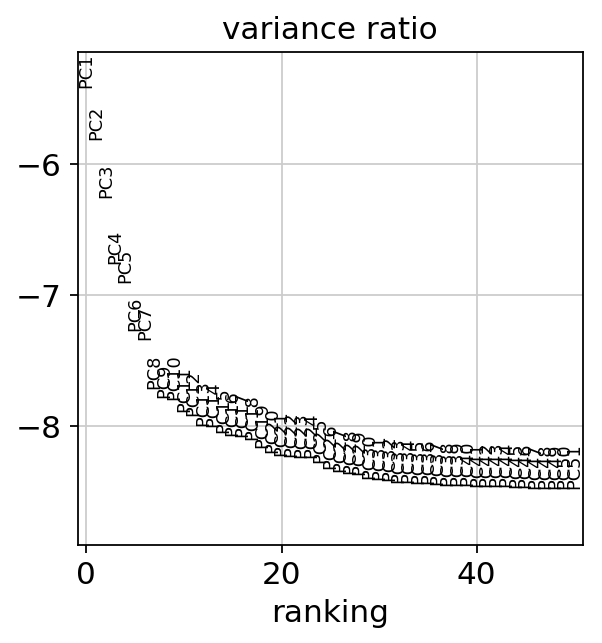

In [7]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=50)

In [66]:
adata.obsm['X_pca'] = adata.obsm['X_pca'][:,[i for i in range(40) if i not in [0, 5, 6]]]

In [76]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=37) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 37
    computed neighbors (0:00:15)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:16)


In [77]:
sc.tl.umap(adata)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:43)


In [78]:
sc.tl.leiden(adata,resolution=1.25)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:47)


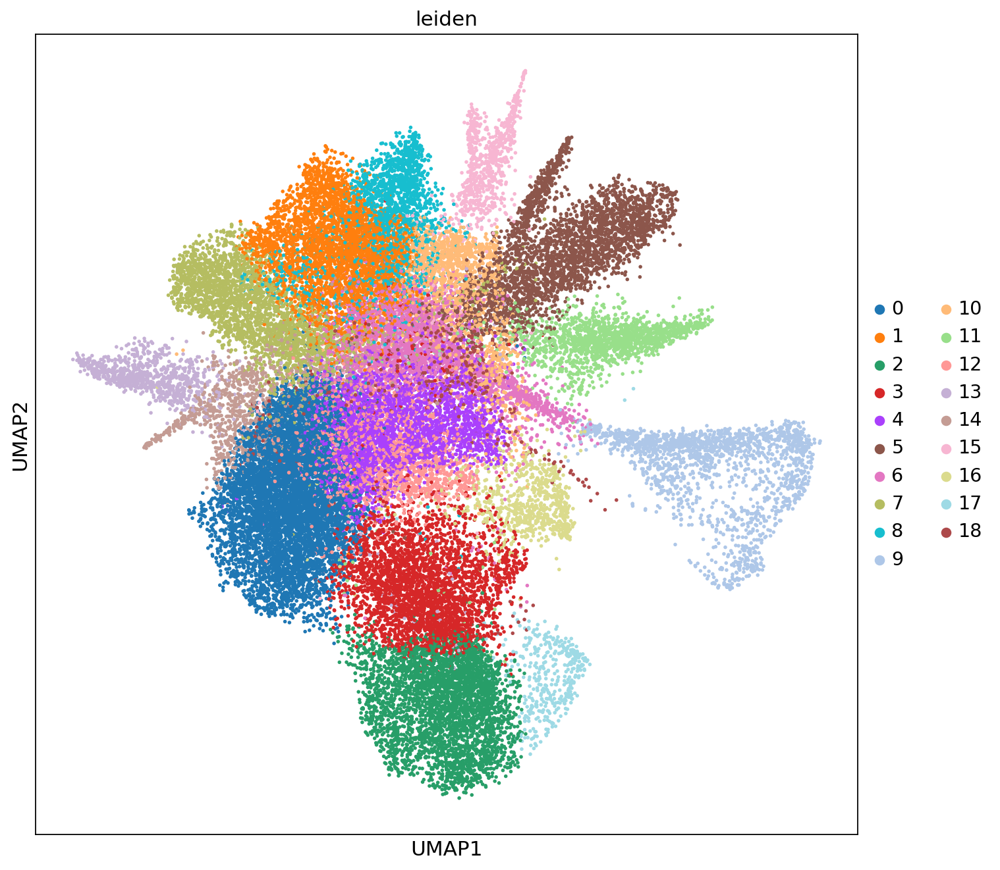

In [79]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sc.pl.umap(adata,color=['leiden'], ax=ax, size=25, palette=sc.pl.palettes.default_20)

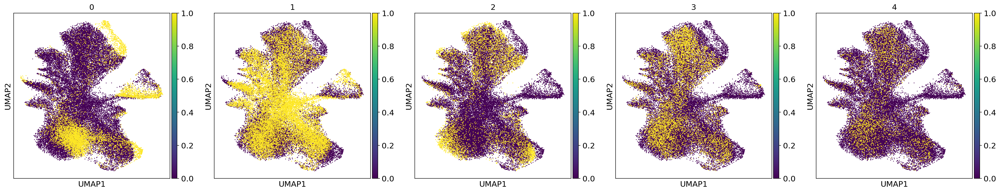

In [12]:
# scanpy's stupid sort order doesn't work with categorical variables, need to make a separate covariate with a "continuous" scale, but I will only make it have two values (0 and 1)
for batch in adata.obs['batch'].unique():
    adata.obs['batch_%s' % batch] = (adata.obs['batch'] == batch).astype(int)

colorby = adata.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    sc.pl.umap(adata,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

We can maybe use 'hg19_RP11-323I15.5', in combination with other factors, as the justification for crap removal:

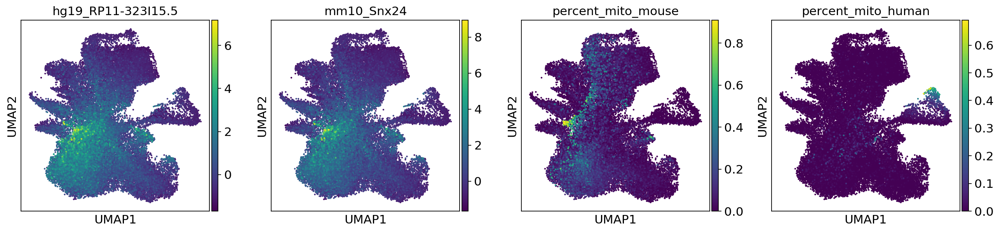

In [12]:
sc.pl.umap(adata,color=['hg19_RP11-323I15.5', 'mm10_Snx24', 'percent_mito_mouse', 'percent_mito_human'], size=15)

In [3]:
adata.write_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.h5ad')
adata = sc.read_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.h5ad')

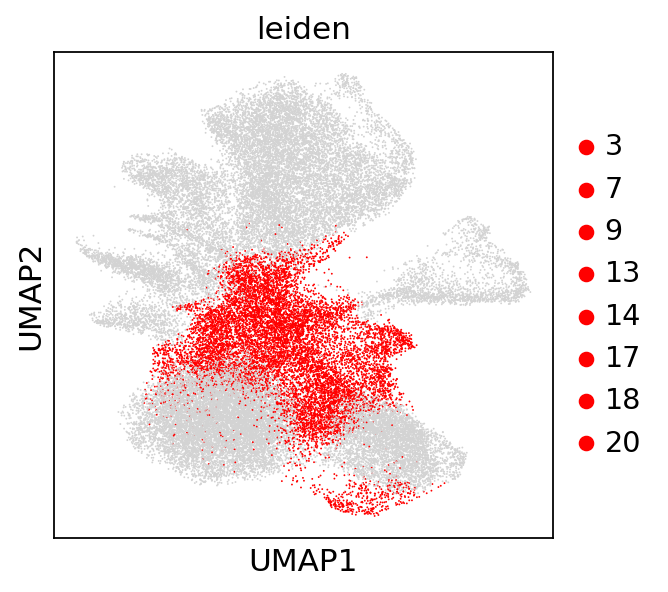

In [4]:
sc.pl.umap(adata,color=['leiden'],groups=['3','7','9','13','14','17','18','20'],palette=['red'])

In [5]:
ctdict = dict()
ctdict['Ambient'] = [3,7,9,13,14,17,18,20]
ctdict['Real'] = [i for i in range(21) if i not in ctdict['Ambient']]
adata.obs['celltype'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

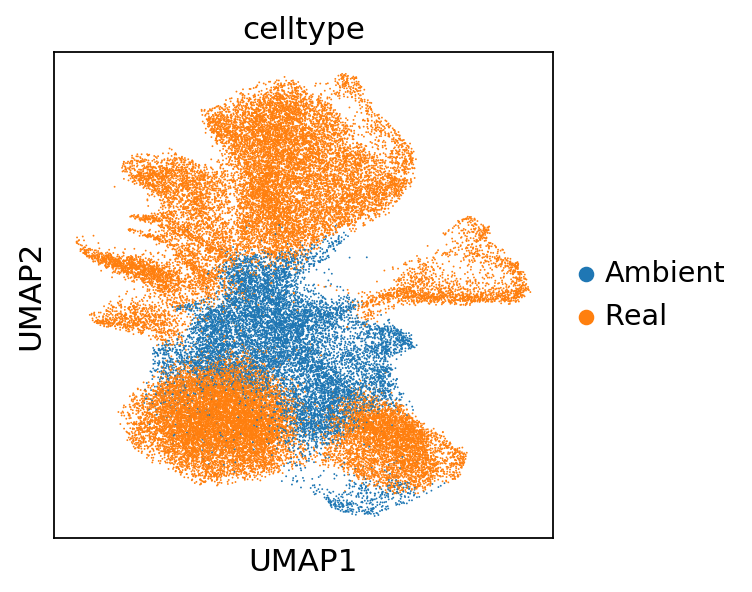

In [6]:
sc.pl.umap(adata,color=['celltype'])

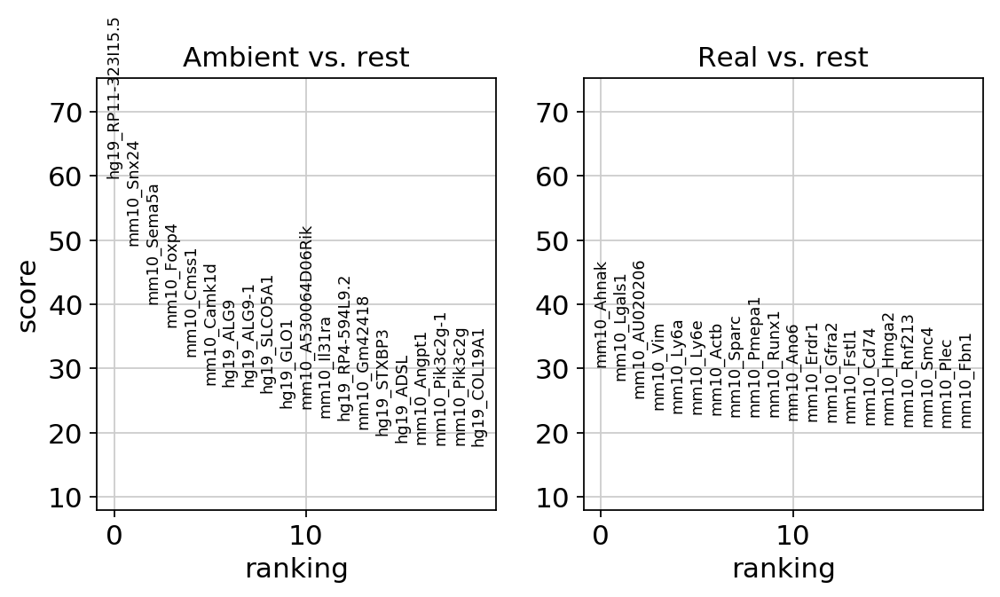

In [7]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [8]:
adata.uns['rank_genes_groups']['names']['Ambient'][:50]

array(['hg19_RP11-323I15.5', 'mm10_Snx24', 'mm10_Sema5a', 'mm10_Foxp4',
       'mm10_Cmss1', 'mm10_Camk1d', 'hg19_ALG9', 'hg19_ALG9-1',
       'hg19_SLCO5A1', 'hg19_GLO1', 'mm10_A530064D06Rik', 'mm10_Il31ra',
       'hg19_RP4-594L9.2', 'mm10_Gm42418', 'hg19_STXBP3', 'hg19_ADSL',
       'mm10_Angpt1', 'mm10_Pik3c2g-1', 'mm10_Pik3c2g', 'hg19_COL19A1',
       'hg19_ANKRD30BL', 'hg19_TMX4', 'hg19_CCDC94', 'hg19_KIF13B',
       'mm10_Dlgap1', 'mm10_Lars2', 'mm10_Rnf152', 'mm10_9330185C12Rik',
       'hg19_XYLT1', 'hg19_COBL', 'mm10_Skint6', 'mm10_Foxn3',
       'hg19_OXR1', 'mm10_Clasp1', 'mm10_Plcd1', 'hg19_PACRG',
       'mm10_AA474408', 'mm10_Itpr2', 'mm10_Lingo2', 'mm10_Spata5',
       'mm10_Ccser1', 'hg19_RYR2', 'hg19_RP11-125O18.1', 'mm10_Galnt18',
       'mm10_Gm26870', 'mm10_Gm26561', 'mm10_Kif5c', 'hg19_AAMDC',
       'mm10_Ppara', 'hg19_BUB1B'], dtype='<U50')

In [9]:
ambient_cells = adata.obs_names[adata.obs['celltype'] == 'Ambient'].values

In [10]:
keep_cells = np.setdiff1d(adata.obs_names.values, ambient_cells)

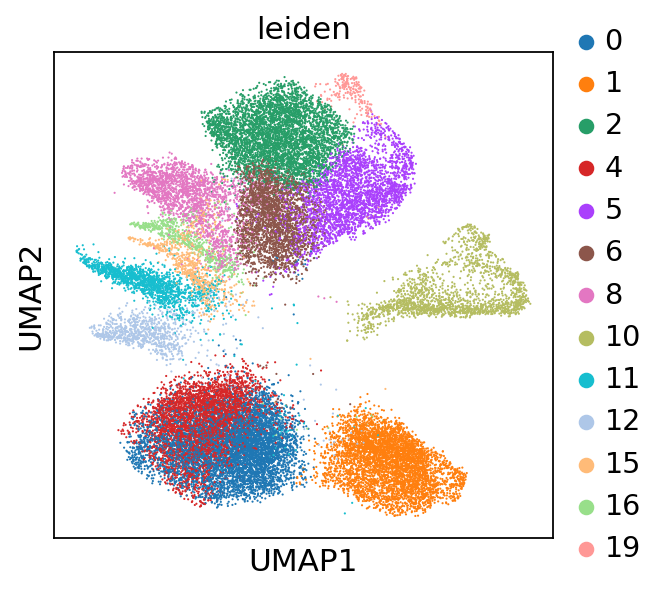

In [11]:
sc.pl.umap(adata[adata.obs['celltype'] != 'Ambient'],color='leiden',palette=sc.pl.palettes.vega_20_scanpy)

In [12]:
keep_genes = [i for i in adata.var_names if i not in adata.uns['rank_genes_groups']['names']['Ambient'][:50]]

In [13]:
adata = adata[keep_cells].copy()

In [14]:
adata = adata[:,keep_genes].copy()

In [3]:
# adata.write_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.subsetted.h5ad')
adata = sc.read_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.subsetted.h5ad')

## Dimensionality Reduction and Visualization II

In [4]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:28)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


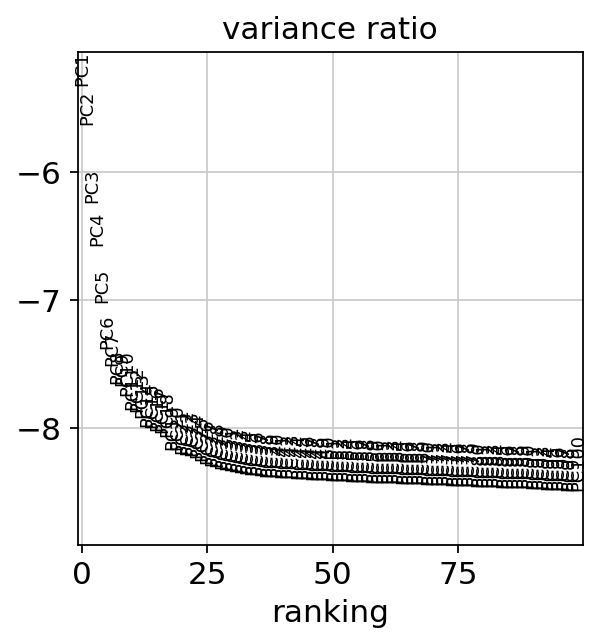

In [5]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=100)

In [6]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=40) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 40
    computed neighbors (0:00:13)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:17)


In [7]:
sc.tl.umap(adata, spread=2, alpha=2)

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:41)


In [8]:
sc.tl.leiden(adata,resolution=0.4)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:10)


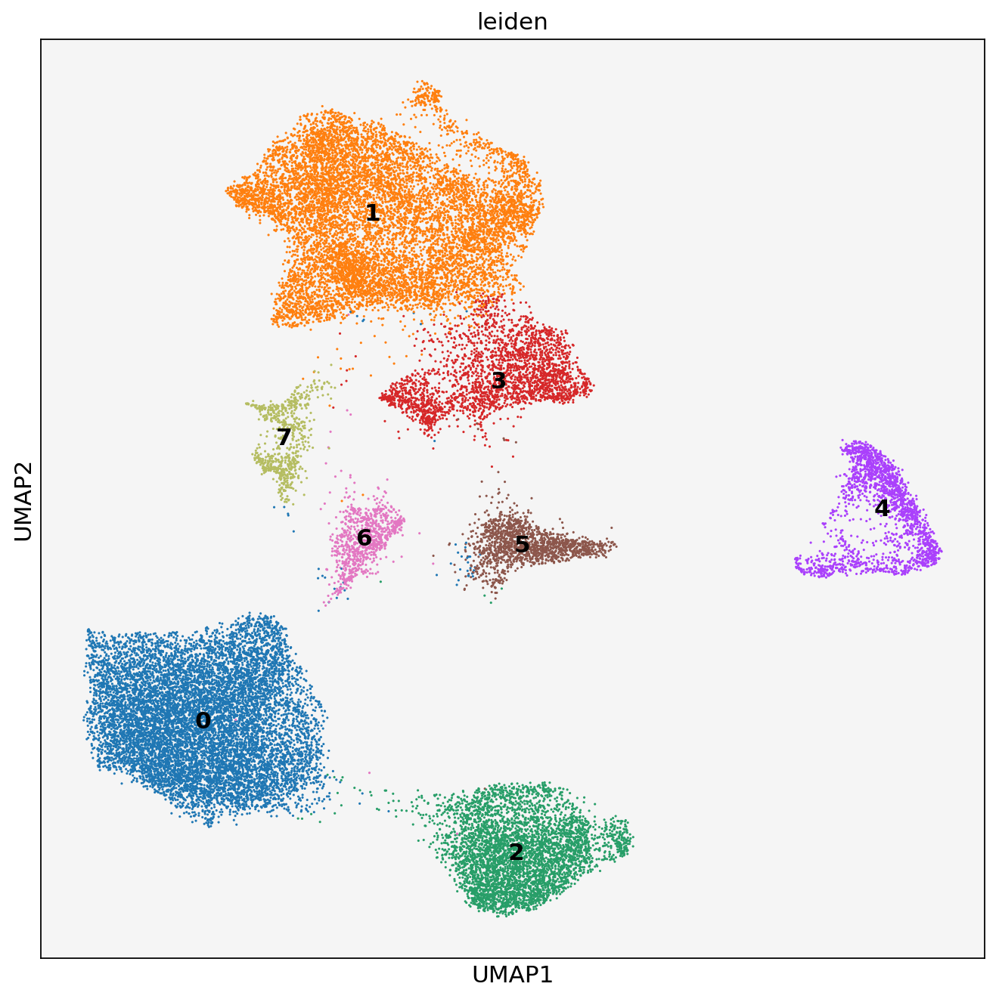

In [9]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

There's definitely more heterogeneity in 3 and 7. Increasing resolution of the leiden clustering and applying it to the entire dataset will eventually subcluster smaller clusters like 3 and 7, but will also likely first subcluster larger clusters like 0 and 1 just by virture of them being larger. So, in order to _only_ subcluster 3 and 7, I will extrac them out and process them separately.

In [10]:
sub_adatas = dict()
sub_adatas['3'] = adata[adata.obs['leiden'] == '3'].copy()
sub_adatas['7'] = adata[adata.obs['leiden'] == '7'].copy()

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


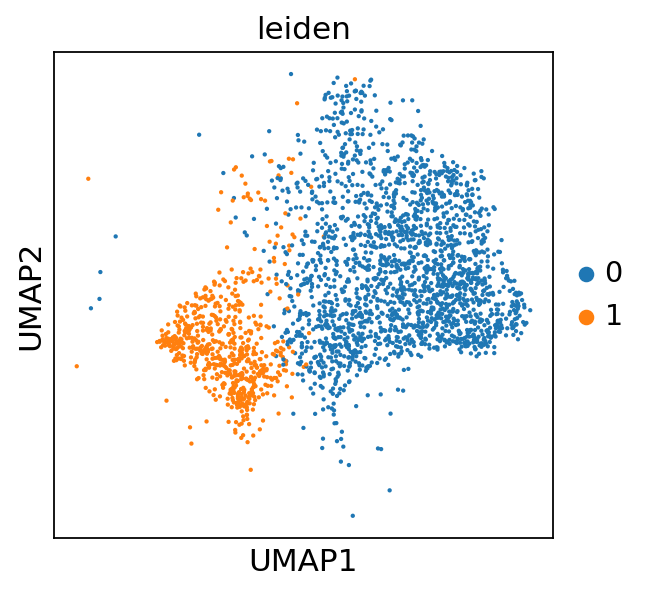

In [11]:
sc.tl.leiden(sub_adatas['3'], resolution=0.2)
sc.pl.umap(sub_adatas['3'], color='leiden', size=15)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


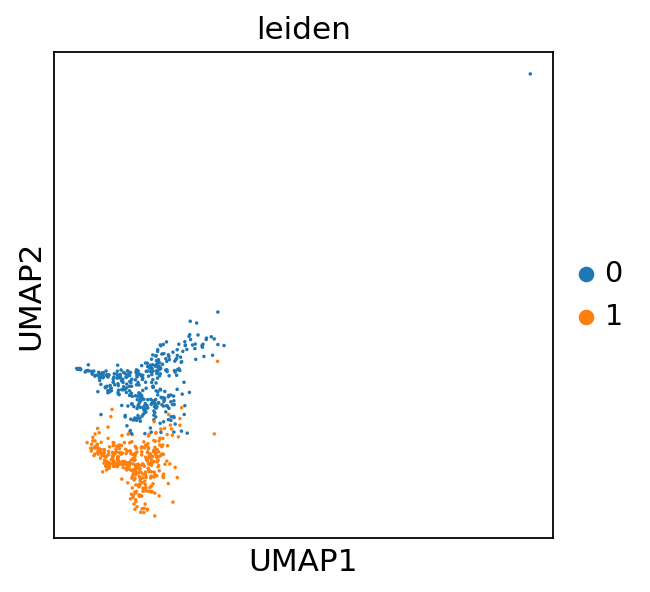

In [12]:
sc.tl.leiden(sub_adatas['7'], resolution=0.2)
sc.pl.umap(sub_adatas['7'], color='leiden', size=10)

Map them back to the clusters on the original adata

In [14]:
def sub_cluster_mapper(adata, sub_adatas):
    '''
    This function is really convoluted and there's probably a better, simpler way to do it,
    but it should theoretically work for any number of subclusters
    '''
    
    # this block is to figure out that there are two new subclusters and they should be named 8, 9
    total_new_clusts = 0
    old_clusts = sub_adatas.keys()
    for sub_adata in sub_adatas:
        total_new_clusts += sub_adatas[sub_adata].obs['leiden'].astype(int).unique().max() + 1
    total_added_clusts = total_new_clusts - len(sub_adatas)
    new_clust_names_start = max(adata.obs['leiden'].astype(int))+1
    new_added_clust_names = [str(i) for i in range(new_clust_names_start,
                                                   new_clust_names_start + total_added_clusts)]
    
    # this block is to build a new list from the old one 
    new_leiden = list()
    leiden_col = adata.obs['leiden'].copy()

    # this builds the new list, now adding a .1, .2, etc. to each new cluster
    for obs in leiden_col.index:
        clust_name = leiden_col.loc[obs]
        if clust_name not in old_clusts or sub_adatas[clust_name].obs.loc[obs, 'leiden'] == '0':
            new_leiden.append(clust_name)
        else:
            new_leiden.append(clust_name + '.%s' % sub_adatas[clust_name].obs.loc[obs,'leiden'])

    # this renames the .1, .2, etc clusters to better names
    new_leiden = pd.Series(new_leiden, index=adata.obs_names)
    added_clusts = np.setdiff1d(new_leiden,adata.obs['leiden'])
    new_leiden.replace(dict(zip(added_clusts, new_added_clust_names)), inplace=True)
    
    # replace the old leiden column
    adata.obs['leiden'] = new_leiden.astype('category')
    return adata

In [15]:
adata = sub_cluster_mapper(adata, sub_adatas)

... storing 'leiden' as categorical


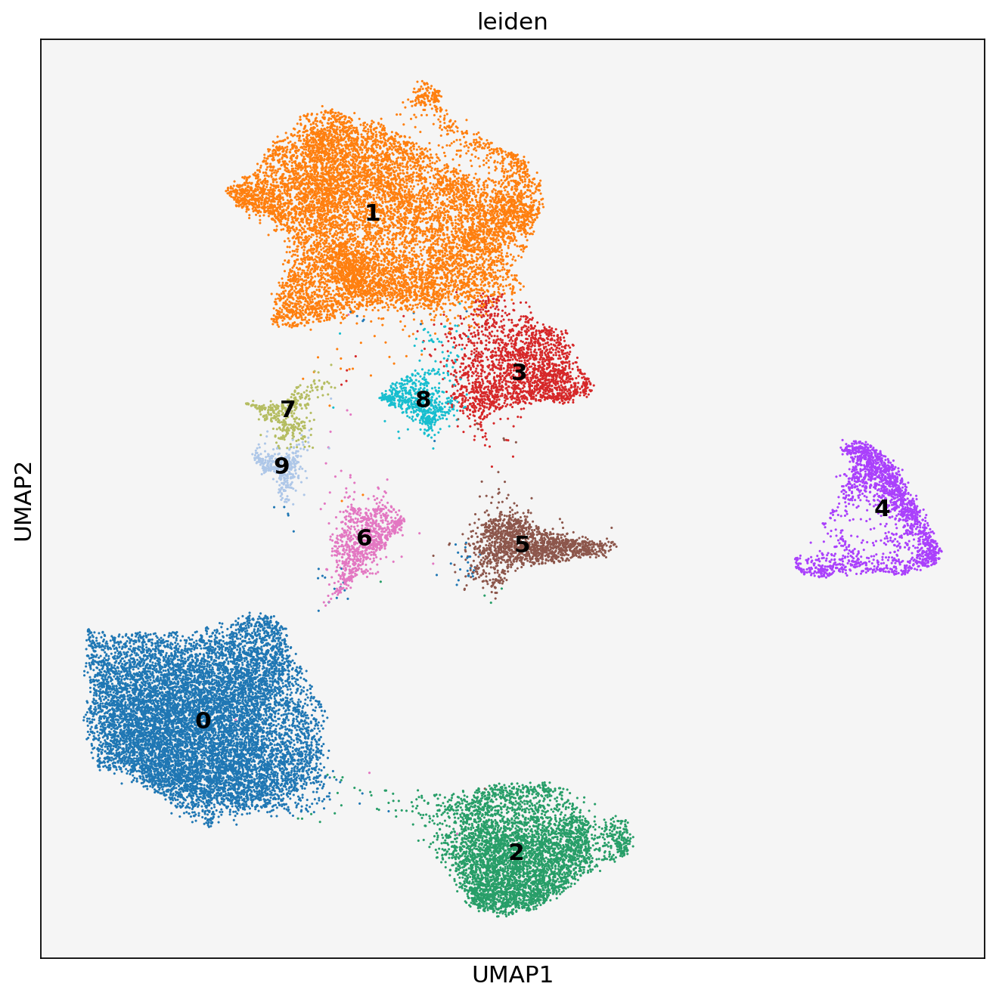

In [17]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

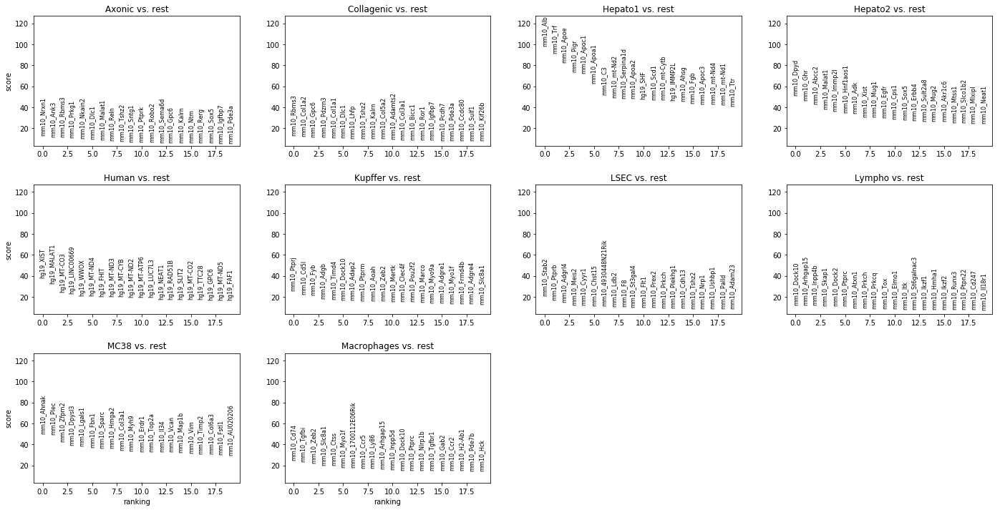

In [8]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype2')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 4

In [296]:
[i for i in adata.var_names if i.startswith('mm10_Cxc')]

['mm10_Cxcl1',
 'mm10_Cxcl9',
 'mm10_Cxcl10',
 'mm10_Cxcl12',
 'mm10_Cxcr5',
 'mm10_Cxcr6',
 'mm10_Cxcl16']

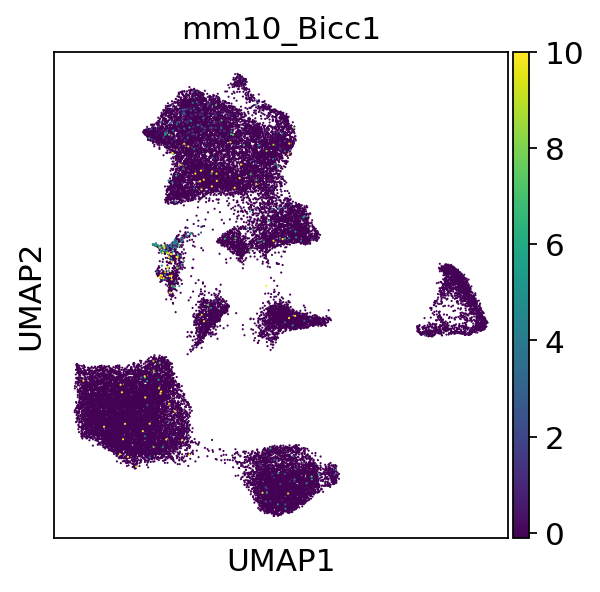

In [300]:
sc.pl.umap(adata,color=['mm10_Bicc1'])#, ax=ax, size=8, palette=sc.pl.palettes.vega_20_scanpy)

In [3]:
ctdict = dict()
ctdict['Immune'] = [3, 5, 8]
ctdict['Special'] = [6, 7, 9]
ctdict['MC38'] = [1]
ctdict['Hepato'] = [0, 2]
ctdict['Human'] = [4]
adata.obs['celltype1'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype1'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype1'] = adata.obs['celltype1'].astype('category')

In [4]:
ctdict = dict()
ctdict['Macrophages'] = [3]
ctdict['Kupffer'] = [5]
ctdict['MC38'] = [1]
ctdict['Hepato1'] = [0]
ctdict['Hepato2'] = [2]
ctdict['LSEC'] = [6]
ctdict['Collagenic'] = [7]
ctdict['Lympho'] = [8]
ctdict['Axonic'] = [9]
ctdict['Human'] = [4]
adata.obs['celltype2'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype2'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype2'] = adata.obs['celltype2'].astype('category')

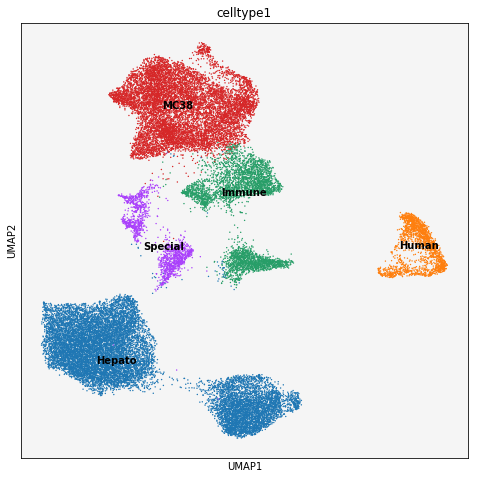

In [5]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['celltype1'], ax=ax, size=8, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

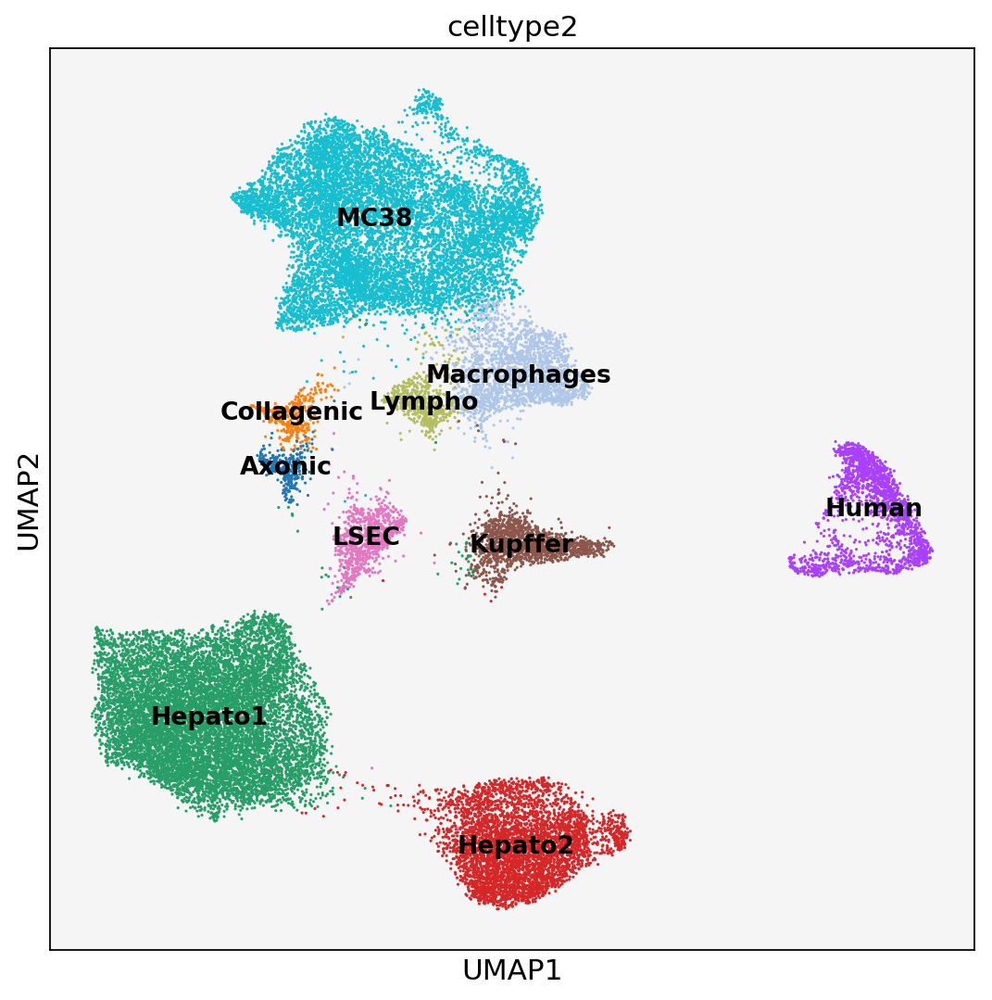

In [299]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['celltype2'], ax=ax, size=8, legend_loc='on data', legend_fontsize=12, palette=sc.pl.palettes.default_20)

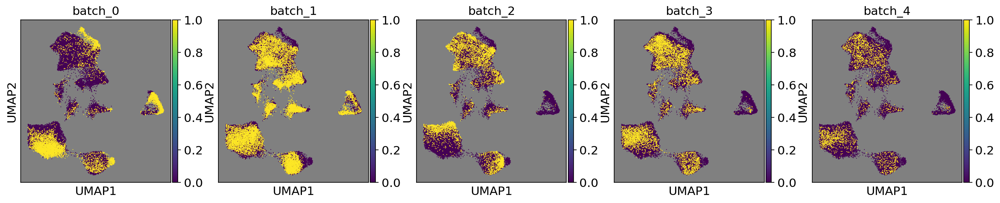

In [5]:
batches = adata.obs['batch'].unique() # get a list of the batches
fig, ax = plt.subplots(1, 5, figsize=(20,3.5))
# make a new column in the `.obs` for each batch that is of dtype `int` so that it gets plotted as a continuous variable instead of a categorical one
for batch, ax in zip(batches, np.ravel(ax)):
    ax.set_facecolor('gray')
    adata.obs['batch_%s' % batch] = (adata.obs['batch'] == batch).astype(int)
    sc.pl.umap(adata, color=['batch_%s' % batch], ax=ax, sort_order=True, show=False, return_fig=False)

In [6]:
np.unique(adata.obs['batch'].values, return_counts=True)

(array(['0', '1', '2', '3', '4'], dtype=object),
 array([ 6491, 12714,  5013,  5412,  2419]))

Export the L20C1 cells to analyze with 10x in joint.L20C1.10x notebook:

# GET RID OF HUMAN CELLS

In [8]:
with open(prefix + 'concatenated.deep/deep2/L20C1.obs_names.txt', 'w') as file:
    for obs in adata.obs_names[(adata.obs['batch'] == '1') & (adata.obs['celltype2'] != 'Human')]:
        file.write(obs + '\n')
        
with open(prefix + 'concatenated.deep/deep2/L20C1.var_names.txt', 'w') as file:
    for var in adata.var_names:
        file.write(var + '\n')

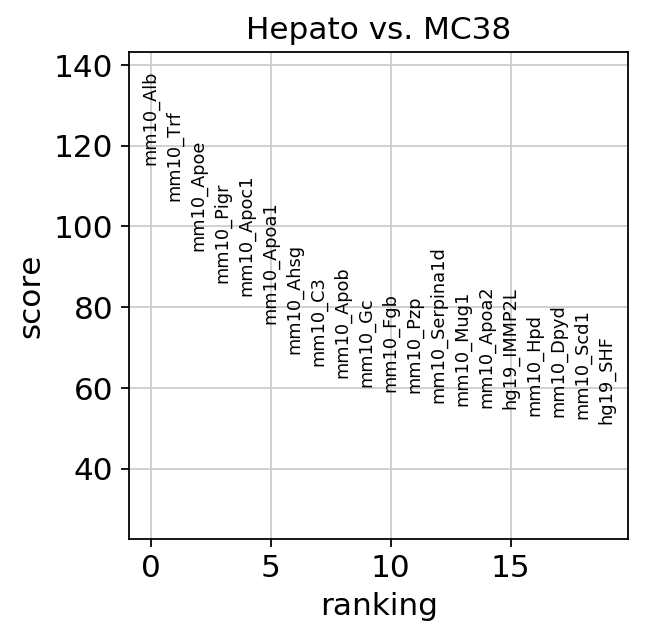

In [28]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype1', groups=['Hepato'], reference='MC38', n_genes=200)
spatial_hepato = adata.uns['rank_genes_groups']['names']['Hepato']
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

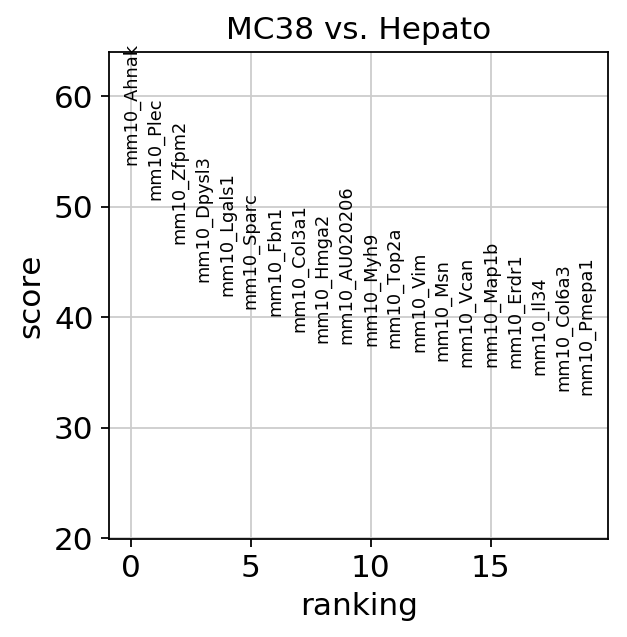

In [29]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype1', groups=['MC38'], reference='Hepato', n_genes=200)
spatial_mc38 = adata.uns['rank_genes_groups']['names']['MC38']
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [30]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype1', groups=['MC38'], reference='Hepato', n_genes=200)
spatial_mc38 = adata.uns['rank_genes_groups']['names']['MC38']
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [30]:
np.setdiff1d(spatial_hepato, spatial_mc38).shape

(200,)

In [31]:
np.setdiff1d(spatial_mc38, spatial_hepato).shape

(200,)

In [32]:
len(set(np.concatenate([spatial_hepato, spatial_mc38])))

400

In [33]:
spatial_hepato = [i for i in spatial_hepato if i.startswith('mm10_')]
len(spatial_hepato)

186

In [34]:
spatial_mc38 = [i for i in spatial_mc38 if i.startswith('mm10_')]
len(spatial_mc38)

200

Export genes here to do spatial analysis

In [35]:
reg_genes_dict = dict()
reg_genes_dict['Hepato'] = spatial_hepato
reg_genes_dict['MC38'] = spatial_mc38

In [36]:
path = prefix + 'concatenated.deep/deep2/reg_genes_dict.pkl'

In [37]:
with open(path, 'wb') as file:
    pkl.dump(reg_genes_dict, file)

In [4]:
# need this, or else it will throw errors later, see: https://github.com/theislab/scanpy/issues/363
keep = ['neighbors', 'leiden','pca','rank_genes_groups']
keys = list(adata.uns.keys())
for key in keys:
    if key not in keep:
        del adata.uns[key]

In [4]:
# adata.write_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.subsetted.dimred.h5ad')
adata = sc.read_h5ad(prefix + 'concatenated.deep/deep2/concat.deep.adata.m.and.h.combatted.dimred.subsetted.dimred.h5ad')

In [54]:
adata.obs.to_csv(prefix + 'concatenated.deep/deep2/covars.deep2.csv')

In [28]:
immune = adata[adata.obs_names[adata.obs['celltype1'] == 'Immune'].values].copy()

In [29]:
immune = immune[:,[i for i in immune.var_names if i.startswith('mm10')]].copy()

In [33]:
sc.tl.leiden(immune,resolution=0.3)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


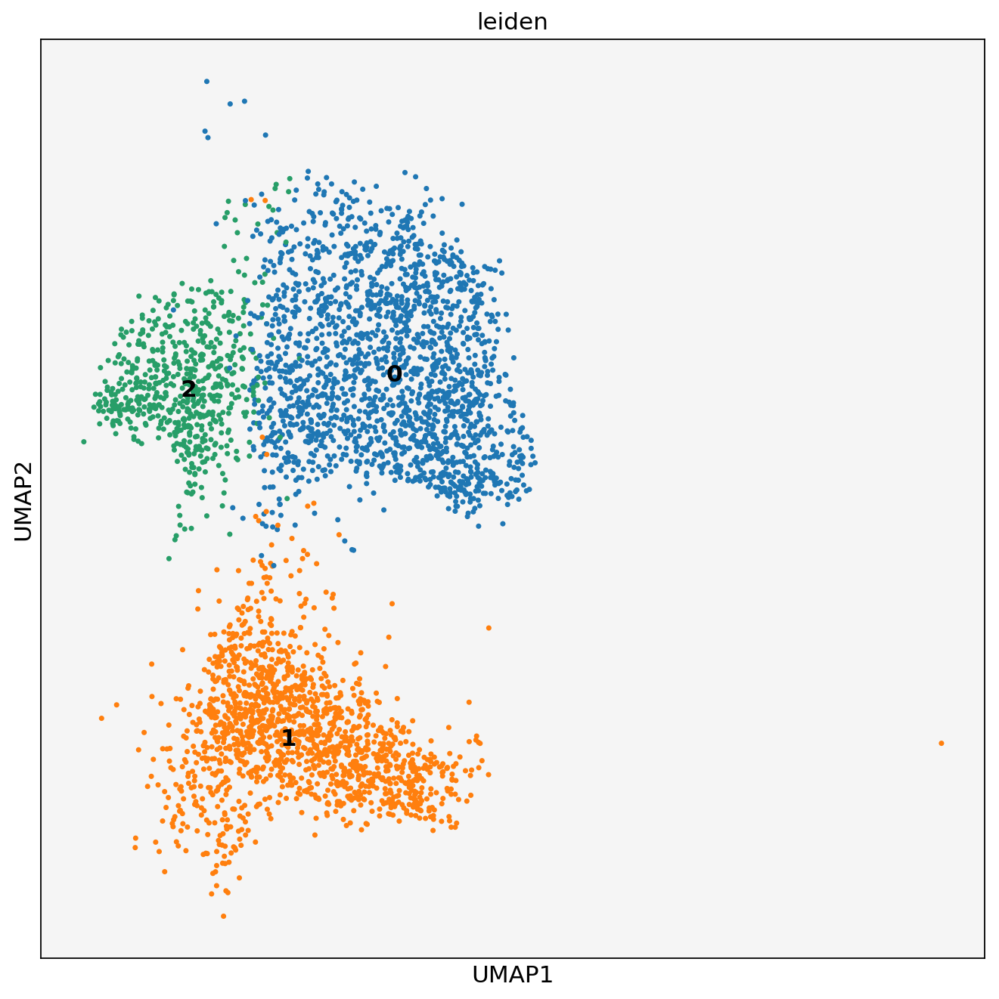

In [34]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(immune,color=['leiden'], ax=ax, size=40, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

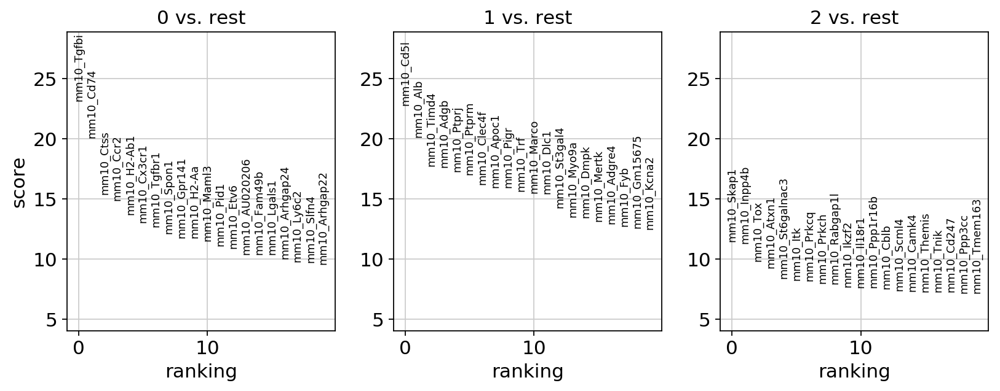

In [35]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune)
sc.settings.verbosity = 3

In [36]:
liver_s = adata[adata.obs_names[adata.obs['celltype1'] == 'Liver Special'].values].copy()

In [37]:
liver_s = liver_s[:,[i for i in liver_s.var_names if i.startswith('mm10')]].copy()

In [55]:
sc.tl.leiden(liver_s,resolution=0.3)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


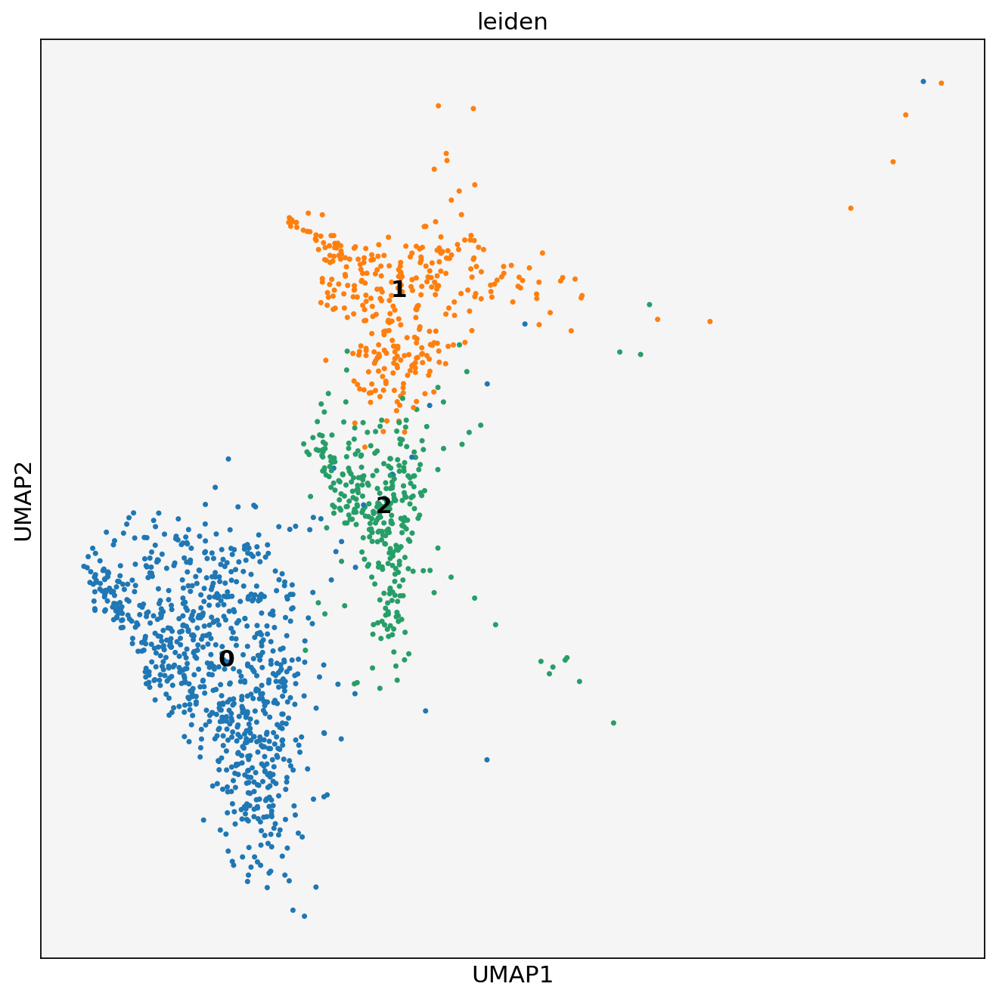

In [56]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(liver_s,color=['leiden'], ax=ax, size=40, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

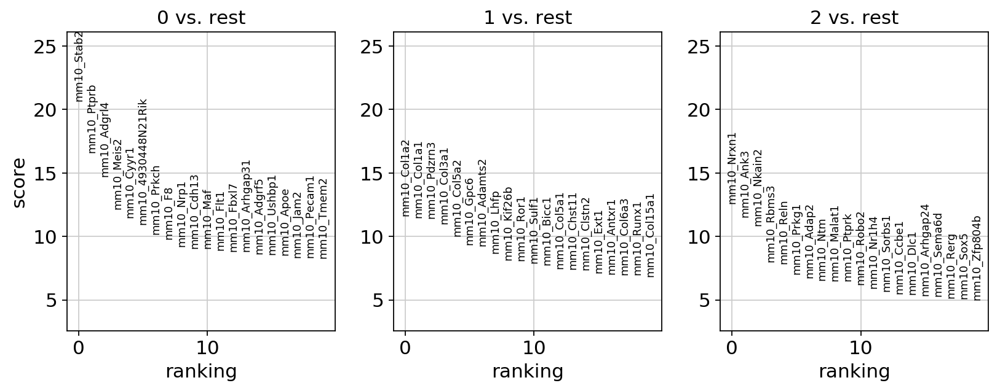

In [63]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(liver_s,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(liver_s)
sc.settings.verbosity = 3

## Make Bubble Plot

Define the genes we want to look at in the bubble plot.

In [253]:
genes = dict()
for ct in adata.obs['celltype2'].unique():
    ct_genes = [i for i in adata.uns['rank_genes_groups']['names'][ct]]
    genes[ct] = [i for i in adata.uns['rank_genes_groups']['names'][ct][:6]]

In [254]:
def invert_dict(d): 
    inverse = dict() 
    for key in d: 
        # Go through the list that is saved in the dict:
        for item in d[key]:
            # Check if in the inverted dict the key exists
            if item not in inverse: 
                # If not create a new list
                inverse[item] = [key] 
            else: 
                inverse[item].append(key) 
    return inverse

In [255]:
genes_inv = invert_dict(genes)

In [256]:
genes_list = np.array([i for j in genes.values() for i in j])

Define the cell types.

In [257]:
cts, counts = np.unique(adata.obs['celltype2'].values, return_counts=True)
counts = counts.astype(np.float16)

In [258]:
for i in range(len(counts)):
    newcount = float(counts[i]) / float(len(adata))
    counts[i] = newcount

Generate two DataFrames, one with the percentage of cells expressing per cell type, and the other with the mean expression of the gene for each cell type.

In [259]:
percentdf = pd.DataFrame(np.zeros((len(cts),len(genes_list))),index=cts,columns=genes_list)
expdf = pd.DataFrame(np.zeros((len(cts),len(genes_list))),index=cts,columns=genes_list)

In [260]:
thresholds = dict() # commented out because I didn't want to risk re-running it and have to redo the gating.

Plot the genes and capture a threshold.

In [261]:
for ct, percent in zip(cts, counts):
    thresholds[ct] = dict()
    for gene in genes[ct]:
        thresh = np.percentile(adata.obs_vector(gene), 100 - percent*100)
        thresholds[ct][gene] = thresh

Fill in the DataFrames I instantiated.

In [269]:
for gene in tqdm(genes_list):
    for ct in cts:
        vals = adata[adata.obs['celltype2'] == ct].obs_vector(gene).copy()
        percentdf.loc[ct,gene] = sum(vals > thresholds[genes_inv[gene][0]][gene])/len(vals)
        expdf.loc[ct,gene] = vals.mean()

Normalize the expression DataFrame in order to 1. mute the expression level for those cell types that have one below the manually defined thresholds, since this is likely just capturing noise, and 2. normalize to the expression level of the most-highly expressing cell type.

In [286]:
expdf_norm = expdf.copy()

In [287]:
for gene in expdf_norm:
    genemin = expdf_norm[gene].min()
    expdf_norm[gene] = expdf_norm[gene] - genemin # shift such that the min is zero
    val = thresholds[genes_inv[gene][0]][gene] + genemin
    if type(val) == pd.Series:
        val = val.iloc[0]
    expdf_norm[gene] = np.where(expdf_norm[gene].values > val, expdf_norm[gene].values, 0) # replace anything below zero with zero
expdf_norm = expdf_norm.div(expdf_norm.sum(axis=0), axis=1)
expdf_norm = expdf_norm.fillna(0)

Plot it.

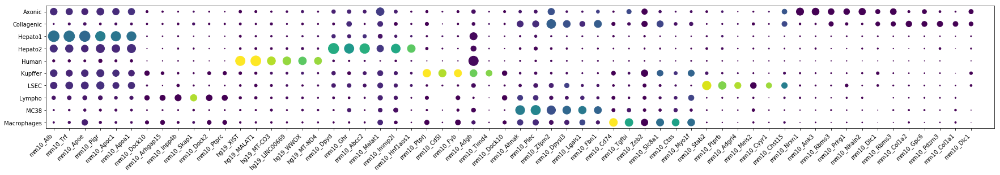

In [288]:
plt.figure(figsize=(30,4))
plt.scatter([i[::-1][0] for i in it.product(range(len(cts))[::-1], 
                                            range(len(genes_list)))], 
            [i[::-1][1] for i in it.product(range(len(cts))[::-1], 
                                            range(len(genes_list)))], 
            s=500*np.ravel(percentdf.values), 
            c=np.ravel(expdf_norm.values));
plt.xticks(range(len(genes_list)),labels=genes_list, rotation=45)
plt.yticks(range(len(cts)),labels=cts[::-1])
plt.xlim(-0.5,len(cts)*len(genes['Hepato1']) + 0.5)
plt.grid(False)
ax = plt.gca()
ax.set_xticklabels(genes_list, ha='right')
plt.show()